# Crawl tên các loài rắn ở Việt Nam

## Crawl với https://vietnamsnakes.com

In [ ]:
from bs4 import BeautifulSoup
import pandas as pd
import os
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from time import sleep

# Khởi tạo Selenium WebDriver
service = Service('/usr/local/bin/chromedriver')
driver = webdriver.Chrome(service=service)
source_url = "https://vietnamsnakes.com/all-of-species"

# Mở trình duyệt và truy cập website
driver.get(source_url)
sleep(2)  # Chờ trang web tải xong
html = driver.page_source
soup = BeautifulSoup(html, "html.parser")

# Danh sách lưu dữ liệu
data = []

# Tìm tất cả các khối chứa danh sách loài rắn
species_blocks = soup.find_all("div", class_="species genus-species-item species-item row row-cols-1 row-cols-sm-2 row-cols-lg-3 row-cols-xl-4")

for species_block in species_blocks:
    # Tìm tất cả các khối con chứa thông tin từng loài rắn
    snake_blocks = species_block.find_all("div", class_="")

    # Tìm tên họ (family) từ thẻ div gần nhất trước khối loài
    family_div = species_block.find_previous("div", class_="fs-md-5 fw-600")
    spans = family_div.find_all("span") if family_div else []
    family_name = spans[-1].text.strip() if spans else "Unknown"

    for block in snake_blocks:
        # Lấy ảnh
        img_div = block.find("div", class_="ratio ratio-16x9 w-100 h-auto")
        img_url = ""
        if img_div:
            img_tag = img_div.find("img")
            if img_tag:
                img_url = img_tag.get("data-src") or img_tag.get("src") or ""
                if img_url and img_url.startswith("/"):
                    img_url = "https://vietnamsnakes.com" + img_url

        # Lấy tên tiếng Việt
        vn_div = block.find("div", class_="fw-600 fs-7 text-truncate text-truncate-1")
        vn_name = vn_div.text.strip() if vn_div else ""

        # Lấy tên tiếng Anh/Latinh
        en_div = block.find("div", class_="fs-8 d-flex justify-content-between align-items-end")
        en_name = ""
        if en_div:
            i_tag = en_div.find("i")
            en_name = i_tag.text.strip() if i_tag else ""

        # Lấy thuộc tính độc tính
        en_div = block.find("div", class_="fs-8 d-flex justify-content-between align-items-end")
        badge1 = ""
        badge2 = ""
        if en_div:
            # Tìm thẻ con d-flex gap-1 chứa các badge
            gap_div = en_div.find("div", class_="d-flex gap-1")
            if gap_div:
                # Tìm tất cả các thẻ badge trong gap_div
                badge_divs = gap_div.find_all("div", class_="badge")
                for i, badge_div in enumerate(badge_divs):
                    i_tag = badge_div.find("i")
                    if i_tag:
                        text = i_tag.text.strip()
                        if i == 0:
                            badge1 = text
                        elif i == 1:
                            badge2 = text
        combined_badge = f"{badge1}, {badge2}" if badge1 and badge2 else badge1 or badge2 or "Không có thông tin độc tính"

        # Lấy vị trí phân bố
        address_div = block.find("div", class_="px-1 fs-7 fs-md-6 mb-3 text-white")
        desc = ""
        if address_div:
            desc_div = address_div.find("div", class_="fs-8")
            desc = desc_div.text.strip() if desc_div else ""

        # Thêm dữ liệu vào danh sách
        data.append({
            "Tên tiếng Việt": vn_name,
            "Tên tiếng Anh/Latinh": en_name,
            "Họ": family_name,
            "Thuộc tính": combined_badge,
            "Vị trí": desc,
            "Ảnh": img_url
        })

# Đóng trình duyệt
driver.quit()

# Lưu dữ liệu vào CSV
file_path = "vietnam_snakes_2.csv"
if os.path.exists(file_path):
    old_df = pd.read_csv(file_path)
    df = pd.concat([old_df, pd.DataFrame(data)], ignore_index=True)
else:
    df = pd.DataFrame(data)

# Lưu vào file CSV
df.to_csv(file_path, index=False, encoding="utf-8-sig")
print("✅ Đã lưu dữ liệu vào vietnam_snakes.csv (có nối thêm nếu file đã tồn tại)")

✅ Đã lưu dữ liệu vào vietnam_snakes.csv (có nối thêm nếu file đã tồn tại)


## Crawl với https://vi.wikipedia.org

In [ ]:
from bs4 import BeautifulSoup
import pandas as pd
import os
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from time import sleep

# Khởi tạo Selenium WebDriver
service = Service('/usr/local/bin/chromedriver')
driver = webdriver.Chrome(service=service)

# Lấy HTML từ Wikipedia (hoặc dùng Selenium nếu cần)
url = "https://en.wikipedia.org/wiki/Category:Snakes_of_Vietnam"
driver.get(url)
sleep(2)  # Chờ trang web tải xong
html = driver.page_source
soup = BeautifulSoup(html, "html.parser")

# Lấy tên loài từ các thẻ <li> trong class mw-category-group
web_names = set()
for group in soup.find_all("div", class_="mw-category-group"):
    ul = group.find("ul")
    if not ul:
        continue
    for li in ul.find_all("li"):
        a_tag = li.find("a")
        if a_tag and a_tag.text.strip():
            web_names.add(a_tag.text.strip())

# Lưu ra CSV
df = pd.DataFrame(sorted(web_names), columns=["Tên tiếng Anh/Latinh"])
df.to_csv("snakes_vietnam_wiki.csv", index=False, encoding="utf-8-sig")

print(f"Đã lưu {len(df)} tên loài vào snakes_vietnam_wiki.csv")


Nhận xét: sau khi crawl dữ liệu từ hai nguồn trên ta nhận thấy rằng có một số loài rắn tuy cùng một loài nhừng có nhiều tên gọi khác nhau, sau khi lọc thủ công ta thu được 197 loài được lưu ra file danh_sach_loai_ran.csv

# Crawl ảnh từ https://api.inaturalist.org

In [ ]:
import os
import requests
import pandas as pd
from time import sleep
from urllib.parse import quote
from concurrent.futures import ThreadPoolExecutor

In [ ]:
csv_path = "danh_sach_loai_ran.csv"
root_folder = "Vietnam_snake"
os.makedirs(root_folder, exist_ok=True)
df = pd.read_csv(csv_path)
MAX_IMAGES = 1000

In [ ]:
def download_image(photo_url, file_path):
    try:
        img_data = requests.get(photo_url, timeout=30).content
        with open(file_path, "wb") as f:
            f.write(img_data)
        return True
    except Exception as e:
        print(f"  Lỗi tải ảnh: {e}")
        return False

In [ ]:
for species in df["Tên tiếng Anh/Latinh"]:
    species_folder = os.path.join(root_folder, species.replace(" ", "_"))
    os.makedirs(species_folder, exist_ok=True)
    print(f"\nĐang crawl ảnh cho loài: {species} ...")

    page = 1
    total_images = len(os.listdir(species_folder))
    stop = False

    while not stop and total_images < MAX_IMAGES:
        url = (
            "https://api.inaturalist.org/v1/observations"
            f"?taxon_name={quote(species)}"
            "&per_page=200"
            f"&page={page}"
        )
        try:
            r = requests.get(url, timeout=30)
            r.raise_for_status()
            data = r.json()
            results = data.get("results", [])
            if not results:
                break

            with ThreadPoolExecutor(max_workers=8) as executor:
                download_jobs = []
                for obs in results:
                    for idx, p in enumerate(obs.get("photos", [])):
                        if total_images >= MAX_IMAGES:   # ✅ chặn ngay khi đạt 500
                            stop = True
                            break

                        photo_url = p.get("url")
                        if not photo_url:
                            continue
                        photo_url = photo_url.replace("square", "original")

                        file_name = f"{obs['id']}_{idx}.jpg"
                        file_path = os.path.join(species_folder, file_name)

                        if not os.path.exists(file_path):
                            download_jobs.append(executor.submit(download_image, photo_url, file_path))
                            total_images += 1   # ✅ tăng ngay khi submit task

                    if stop:
                        break

                # chờ tất cả job của vòng này xong
                for job in download_jobs:
                    job.result()

            print(f"  ✅ Trang {page}: tổng {total_images} ảnh")
            page += 1
            sleep(1)

        except Exception as e:
            print(f"❌ Lỗi với loài {species}: {e}")
            break

    print(f"🎉 Hoàn tất {species}. Tổng số ảnh: {total_images}")


Đang crawl ảnh cho loài: Achalinus ater ...
  ✅ Trang 1: tổng 3 ảnh
🎉 Hoàn tất Achalinus ater. Tổng số ảnh: 3

Đang crawl ảnh cho loài: Achalinus rufescens ...
  ✅ Trang 1: tổng 334 ảnh
🎉 Hoàn tất Achalinus rufescens. Tổng số ảnh: 334

Đang crawl ảnh cho loài: Achalinus spinalis ...
  ✅ Trang 1: tổng 174 ảnh
🎉 Hoàn tất Achalinus spinalis. Tổng số ảnh: 174

Đang crawl ảnh cho loài: Achalinus vanhoensis ...
  ✅ Trang 1: tổng 1 ảnh
🎉 Hoàn tất Achalinus vanhoensis. Tổng số ảnh: 1

Đang crawl ảnh cho loài: Acrochordus granulatus ...
  ✅ Trang 1: tổng 429 ảnh
  ✅ Trang 2: tổng 429 ảnh
🎉 Hoàn tất Acrochordus granulatus. Tổng số ảnh: 429

Đang crawl ảnh cho loài: Acrochordus javanicus ...
  ✅ Trang 1: tổng 65 ảnh
🎉 Hoàn tất Acrochordus javanicus. Tổng số ảnh: 65

Đang crawl ảnh cho loài: Ahaetulla fusca ...
  ✅ Trang 1: tổng 757 ảnh
  ✅ Trang 2: tổng 757 ảnh
🎉 Hoàn tất Ahaetulla fusca. Tổng số ảnh: 757

Đang crawl ảnh cho loài: Ahaetulla prasina ...
🎉 Hoàn tất Ahaetulla prasina. Tổng số ảnh: 

# Kiểm tra kích thước ảnh sau khi crawl

In [ ]:
import random
folder = "Vietnam_snake"
image_paths = []

# Lấy tất cả đường dẫn ảnh từ các folder con
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'))]
        for f in img_files:
            image_paths.append(os.path.join(folder_path, f))

# Chọn 20 ảnh ngẫu nhiên
sample_images = random.sample(image_paths, min(20, len(image_paths)))

# In kích thước của 20 ảnh random
for img_path in sample_images:
    try:
        with Image.open(img_path) as img:
            print(f"{img_path}: {img.width}x{img.height}")
    except Exception as e:
        print(f"Lỗi mở {img_path}: {e}")

Vietnam_snake/Protobothrops_mucrosquamatus/279124259_0.jpg: 946x2048
Vietnam_snake/Oligodon_taeniatus/255571191_2.jpg: 1536x2048
Vietnam_snake/Sibynophis_collaris/308963053_1.jpg: 1152x2048
Vietnam_snake/Ovophis_monticola/236278114_1.jpg: 946x2048
Vietnam_snake/Fowlea_flavipunctata/301911039_0.jpg: 640x1156
Vietnam_snake/Ptyas_major/245866008_0.jpg: 1536x2048
Vietnam_snake/Rhabdophis_tigrinus/250871028_0.jpg: 1715x2048
Vietnam_snake/Ptyas_carinata/260114736_0.jpg: 2048x1154
Vietnam_snake/Lycodon_capucinus/304029001_1.jpg: 945x2048
Vietnam_snake/Hypsiscopus_murphyi/215496839_0.jpg: 2048x1365
Lỗi mở Vietnam_snake/Rhabdophis_siamensis/130599135_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_siamensis/130599135_0.jpg'
Vietnam_snake/Ptyas_dhumnades/232007544_0.jpg: 2048x1365
Vietnam_snake/Bungarus_fasciatus/155570816_0.jpg: 2048x1536
Vietnam_snake/Ptyas_dhumnades/311686121_0.jpg: 2048x1542
Vietnam_snake/Laticauda_colubrina/265818760_2.jpg: 2048x1365
Vietnam_snake/Naja_atra/2825

# Số lượng các loài và số ảnh của mỗi loài

## Số lượng ảnh

In [2]:
import os

folder = "Vietnam_snake"
count = 0

for species_folder in os.listdir(folder):
    species_path = os.path.join(folder, species_folder)
    if os.path.isdir(species_path):
        for file in os.listdir(species_path):
            file_path = os.path.join(species_path, file)
            # Đếm tất cả file, hoặc chỉ đếm file ảnh nếu muốn:
            if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                count += 1

print(f"Tổng số ảnh trong {folder}: {count}")

Tổng số ảnh trong Vietnam_snake: 75988


## Số lượng các loài

In [ ]:
folder = "Vietnam_snake"
species_list = []

for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        species_name = species_folder.replace("_", " ")
        print(f"{species_name}: {len(img_files)} ảnh")
        species_list.append(species_name)

print(f"\nTổng số loài: {len(species_list)}")

Achalinus ater: 3 ảnh
Achalinus rufescens: 334 ảnh
Achalinus spinalis: 174 ảnh
Achalinus vanhoensis: 1 ảnh
Acrochordus granulatus: 429 ảnh
Acrochordus javanicus: 65 ảnh
Ahaetulla fusca: 757 ảnh
Ahaetulla prasina: 1000 ảnh
Ahaetulla rufusoculara: 75 ảnh
Amphiesma stolatum: 1000 ảnh
Archelaphe bella: 21 ảnh
Argyrophis diardii: 88 ảnh
Argyrophis siamensis: 3 ảnh
Azemiops feae: 28 ảnh
Blue-lipped sea krait: 819 ảnh
Boiga cyanea: 658 ảnh
Boiga guangxiensis: 133 ảnh
Boiga jaspidea: 327 ảnh
Boiga kraepelini: 1000 ảnh
Boiga multomaculata: 1000 ảnh
Boiga siamensis: 270 ảnh
Bungarus bungaroides: 20 ảnh
Bungarus candidus: 1000 ảnh
Bungarus fasciatus: 1000 ảnh
Bungarus slowinskii: 11 ảnh
Bungarus wanghaotingi: 135 ảnh
Calamaria buchi: 8 ảnh
Calamaria concolor: 11 ảnh
Calamaria septentrionalis: 239 ảnh
Calliophis maculiceps: 272 ảnh
Calloselasma rhodostoma: 1000 ảnh
Cerberus schneiderii: 1000 ảnh
Checkered keelback: 1000 ảnh
Chrysopelea ornata: 1000 ảnh
Coelognathus flavolineatus: 914 ảnh
Coelognat

## Số ảnh của mỗi loài

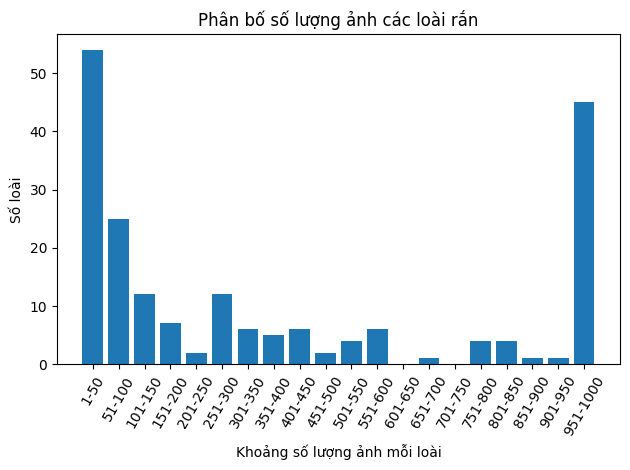

In [ ]:
# Tạo bins tự động với bước nhảy 50
max_count = 0
counts = []
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))
        if len(img_files) > max_count:
            max_count = len(img_files)

step = 50
bins = list(range(0, max_count + step, step))
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]

# Gom số loài vào từng khoảng
hist = [0] * (len(bins) - 1)
for c in counts:
    for i in range(len(bins) - 1):
        if bins[i] < c <= bins[i+1]:
            hist[i] += 1
            break

plt.bar(labels, hist)
plt.xlabel("Khoảng số lượng ảnh mỗi loài")
plt.ylabel("Số loài")
plt.title("Phân bố số lượng ảnh các loài rắn")
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

## Biểu đồ tròn cho số loài

Q1 (<= 36.0 ảnh), Q2 (<= 228.0 ảnh), Q3 (<= 819.0 ảnh), Q4 (> 819.0 ảnh)


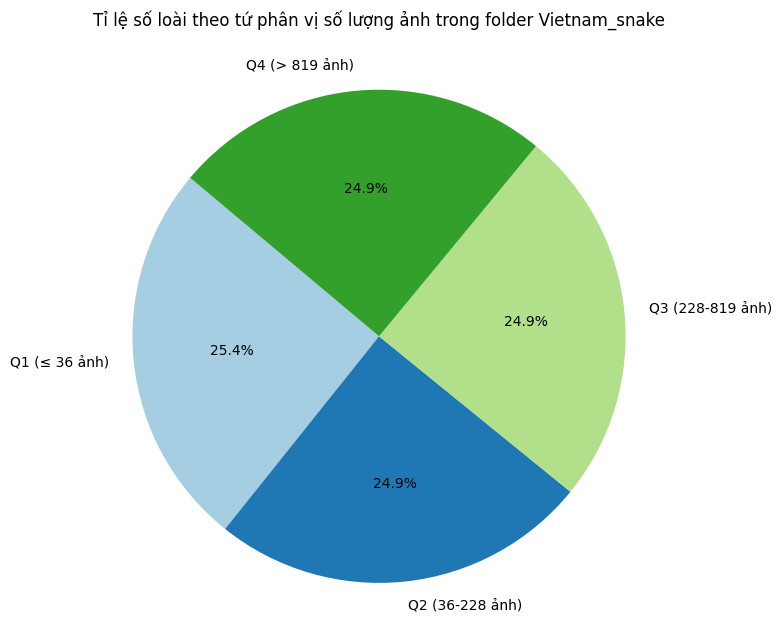

In [13]:
import os
import matplotlib.pyplot as plt
import numpy as np

folder = "Vietnam_snake"
counts = []

# Đếm số ảnh của từng loài
for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))

counts = np.array(counts)

# Tính các tứ phân vị
q1 = np.percentile(counts, 25)
q2 = np.percentile(counts, 50)
q3 = np.percentile(counts, 75)

# In ra khoảng của từng tứ phân vị
print(f"Q1 (<= {q1:.1f} ảnh), Q2 (<= {q2:.1f} ảnh), Q3 (<= {q3:.1f} ảnh), Q4 (> {q3:.1f} ảnh)")

# Đếm số loài thuộc từng tứ phân vị
quartile_counts = [
    np.sum(counts <= q1),
    np.sum((counts > q1) & (counts <= q2)),
    np.sum((counts > q2) & (counts <= q3)),
    np.sum(counts > q3)
]
quartile_labels = [
    f'Q1 (≤ {q1:.0f} ảnh)',
    f'Q2 ({q1:.0f}-{q2:.0f} ảnh)',
    f'Q3 ({q2:.0f}-{q3:.0f} ảnh)',
    f'Q4 (> {q3:.0f} ảnh)'
]
colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c']

plt.figure(figsize=(7, 7))
plt.pie(quartile_counts, labels=quartile_labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Tỉ lệ số loài theo tứ phân vị số lượng ảnh trong folder Vietnam_snake",pad=30)
plt.axis('equal')
plt.show()

In [ ]:
for label, count in zip(quartile_labels, quartile_counts):
    print(f"{label}: {count} loài")


Q1 (≤ 36 ảnh): 50 loài
Q2 (36-228 ảnh): 49 loài
Q3 (228-819 ảnh): 49 loài
Q4 (> 819 ảnh): 49 loài


# Resize 1024px

In [ ]:
from PIL import Image
import os
from concurrent.futures import ThreadPoolExecutor

src_root = "Vietnam_snake"
dst_root = "Vietnam_snake_1024px"
os.makedirs(dst_root, exist_ok=True)

def resize_image(src_img_path, dst_img_path):
    try:
        img = Image.open(src_img_path)
        img = img.resize((1024, 1024), Image.LANCZOS)
        img.save(dst_img_path)
    except Exception as e:
        print(f"Lỗi resize {src_img_path}: {e}")

for species_folder in os.listdir(src_root):
    src_folder_path = os.path.join(src_root, species_folder)
    dst_folder_path = os.path.join(dst_root, species_folder)
    if os.path.isdir(src_folder_path):
        os.makedirs(dst_folder_path, exist_ok=True)
        jobs = []
        with ThreadPoolExecutor(max_workers=16) as executor:  # Tăng số luồng nếu máy mạnh
            for file in os.listdir(src_folder_path):
                if file.lower().endswith(".jpg"):
                    src_img_path = os.path.join(src_folder_path, file)
                    dst_img_path = os.path.join(dst_folder_path, file)
                    jobs.append(executor.submit(resize_image, src_img_path, dst_img_path))
            for job in jobs:
                job.result()

Lỗi resize Vietnam_snake/Hebius_sauteri/263973752_0.jpg: cannot write mode RGBA as JPEG
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/242465522_1.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/242465522_1.jpg'
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/276976208_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/276976208_0.jpg'
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/110729523_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/110729523_0.jpg'
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/35447010_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/35447010_0.jpg'
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/30875986_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/30875986_0.jpg'
Lỗi resize Vietnam_snake/Rhabdophis_nigrocinctus/287187716_0.jpg: cannot identify image file 'Vietnam_snake/Rhabdophis_nigrocinctus/287187716_0.jpg'
Lỗi resize Vietnam_sna

# Xóa các loài dưới 50 ảnh

In [ ]:
import os
import shutil

folder = "Vietnam_snake_1024px"
count_deleted = 0

for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        # Đếm số file ảnh
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        if len(img_files) < 50:
            shutil.rmtree(folder_path)
            print(f"Đã xóa folder: {species_folder} ({len(img_files)} ảnh)")
            count_deleted += 1

print(f"✅ Đã xóa {count_deleted} folder không đủ ảnh.")

Đã xóa folder: Bungarus_slowinskii (11 ảnh)
Đã xóa folder: Hebius_deschauenseei (36 ảnh)
Đã xóa folder: Enhydris_innominata (12 ảnh)
Đã xóa folder: Trimerodytes_balteatus (22 ảnh)
Đã xóa folder: Oligodon_culaochamensis (5 ảnh)
Đã xóa folder: Rhabdophis_hmongorum (9 ảnh)
Đã xóa folder: Oligodon_lacroixi (13 ảnh)
Đã xóa folder: Plagiopholis_styani (40 ảnh)
Đã xóa folder: Calamaria_concolor (9 ảnh)
Đã xóa folder: Achalinus_ater (3 ảnh)
Đã xóa folder: Microcephalophis_gracilis (5 ảnh)
Đã xóa folder: Psammophis_indochinensis (14 ảnh)
Đã xóa folder: Oligodon_saintgironsi (13 ảnh)
Đã xóa folder: Hebius_chapaensis (24 ảnh)
Đã xóa folder: Dendrelaphis_binhi (7 ảnh)
Đã xóa folder: Trimeresurus_truongsonensis (6 ảnh)
Đã xóa folder: Lycodon_cardamomensis (2 ảnh)
Đã xóa folder: Argyrophis_siamensis (3 ảnh)
Đã xóa folder: Liopeltis_pallidonuchalis (8 ảnh)
Đã xóa folder: Hebius_bitaeniatus (33 ảnh)
Đã xóa folder: Pareas_temporalis (13 ảnh)
Đã xóa folder: Fimbrios_smithi (2 ảnh)
Đã xóa folder: Pareas_

# Số lượng các loài và số ảnh của mỗi loài sau khi resize về 1024

## Số lượng ảnh

In [3]:
import os

folder = "Vietnam_snake_1024px"
count = 0

for species_folder in os.listdir(folder):
    species_path = os.path.join(folder, species_folder)
    if os.path.isdir(species_path):
        for file in os.listdir(species_path):
            file_path = os.path.join(species_path, file)
            # Đếm tất cả file, hoặc chỉ đếm file ảnh nếu muốn:
            if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                count += 1

print(f"Tổng số ảnh trong {folder}: {count}")

Tổng số ảnh trong Vietnam_snake_1024px: 70187


## Số lượng các loài

In [ ]:
folder = "Vietnam_snake_1024px"
species_list = []

for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        species_name = species_folder.replace("_", " ")
        print(f"{species_name}: {len(img_files)} ảnh")
        species_list.append(species_name)

print(f"\nTổng số loài: {len(species_list)}")

Achalinus rufescens: 333 ảnh
Achalinus spinalis: 174 ảnh
Acrochordus granulatus: 425 ảnh
Acrochordus javanicus: 65 ảnh
Ahaetulla fusca: 757 ảnh
Ahaetulla prasina: 999 ảnh
Ahaetulla rufusoculara: 75 ảnh
Amphiesma stolatum: 997 ảnh
Argyrophis diardii: 88 ảnh
Blue-lipped sea krait: 814 ảnh
Boiga cyanea: 654 ảnh
Boiga guangxiensis: 133 ảnh
Boiga jaspidea: 325 ảnh
Boiga kraepelini: 993 ảnh
Boiga multomaculata: 997 ảnh
Boiga siamensis: 270 ảnh
Bungarus candidus: 1000 ảnh
Bungarus fasciatus: 997 ảnh
Bungarus wanghaotingi: 135 ảnh
Calamaria septentrionalis: 238 ảnh
Calliophis maculiceps: 268 ảnh
Calloselasma rhodostoma: 998 ảnh
Cerberus schneiderii: 993 ảnh
Checkered keelback: 999 ảnh
Chrysopelea ornata: 1000 ảnh
Coelognathus flavolineatus: 913 ảnh
Coelognathus radiatus: 993 ảnh
Cylindrophis jodiae: 562 ảnh
Cylindrophis ruffus: 350 ảnh
Deinagkistrodon acutus: 997 ảnh
Dendrelaphis ngansonensis: 378 ảnh
Dendrelaphis proarchos: 165 ảnh
Dendrelaphis subocularis: 268 ảnh
Dryophiops rubescens: 411 ả

## Số ảnh của mỗi loài

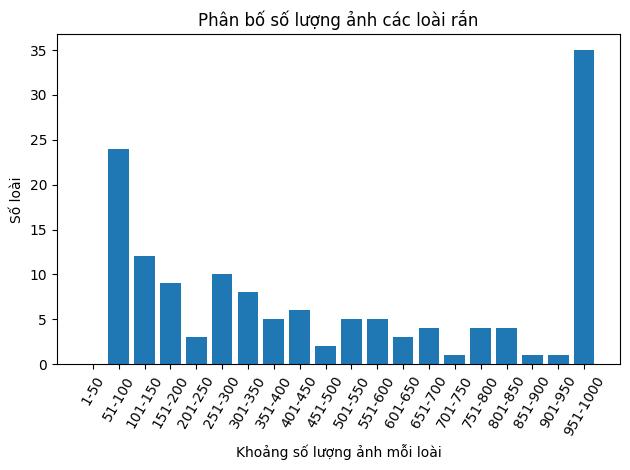

In [ ]:
# Tạo bins tự động với bước nhảy 50
max_count = 0
counts = []
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))
        if len(img_files) > max_count:
            max_count = len(img_files)

step = 50
bins = list(range(0, max_count + step, step))
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]

# Gom số loài vào từng khoảng
hist = [0] * (len(bins) - 1)
for c in counts:
    for i in range(len(bins) - 1):
        if bins[i] < c <= bins[i+1]:
            hist[i] += 1
            break

plt.bar(labels, hist)
plt.xlabel("Khoảng số lượng ảnh mỗi loài")
plt.ylabel("Số loài")
plt.title("Phân bố số lượng ảnh các loài rắn")
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

#

## Biểu đồ tròn cho số loài

Q1 (<= 148.0 ảnh), Q2 (<= 399.0 ảnh), Q3 (<= 905.5 ảnh), Q4 (> 905.5 ảnh)


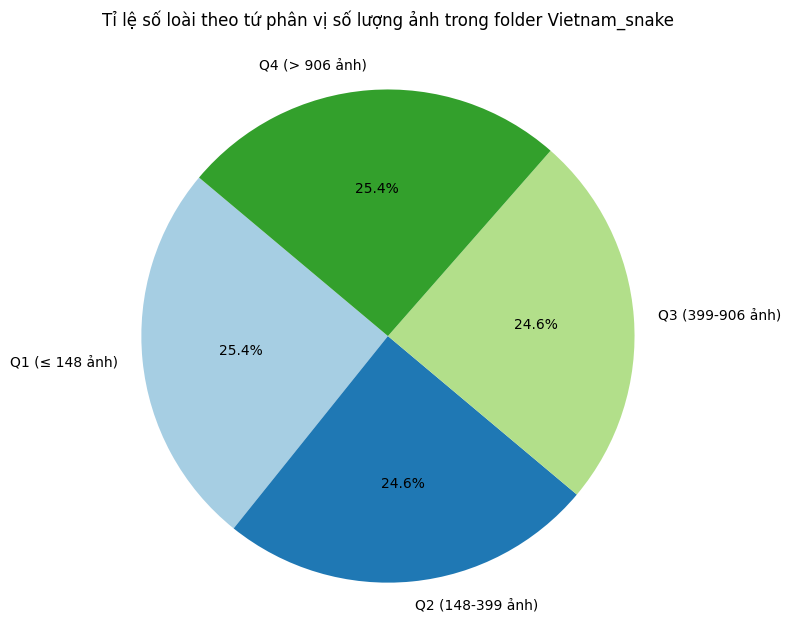

In [11]:
import os
import matplotlib.pyplot as plt
import numpy as np

folder = "Vietnam_snake_1024px"
counts = []

# Đếm số ảnh của từng loài
for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))

counts = np.array(counts)

# Tính các tứ phân vị
q1 = np.percentile(counts, 25)
q2 = np.percentile(counts, 50)
q3 = np.percentile(counts, 75)

# In ra khoảng của từng tứ phân vị
print(f"Q1 (<= {q1:.1f} ảnh), Q2 (<= {q2:.1f} ảnh), Q3 (<= {q3:.1f} ảnh), Q4 (> {q3:.1f} ảnh)")

# Đếm số loài thuộc từng tứ phân vị
quartile_counts = [
    np.sum(counts <= q1),
    np.sum((counts > q1) & (counts <= q2)),
    np.sum((counts > q2) & (counts <= q3)),
    np.sum(counts > q3)
]
quartile_labels = [
    f'Q1 (≤ {q1:.0f} ảnh)',
    f'Q2 ({q1:.0f}-{q2:.0f} ảnh)',
    f'Q3 ({q2:.0f}-{q3:.0f} ảnh)',
    f'Q4 (> {q3:.0f} ảnh)'
]
colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c']

plt.figure(figsize=(7, 7))
plt.pie(quartile_counts, labels=quartile_labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Tỉ lệ số loài theo tứ phân vị số lượng ảnh trong folder Vietnam_snake",pad=30)
plt.axis('equal')
plt.show()

In [12]:
for label, count in zip(quartile_labels, quartile_counts):
    print(f"{label}: {count} loài")


Q1 (≤ 148 ảnh): 36 loài
Q2 (148-399 ảnh): 35 loài
Q3 (399-906 ảnh): 35 loài
Q4 (> 906 ảnh): 36 loài


# Dùng yolo để detect và crop các loài

In [ ]:
from ultralytics import YOLO
import os
import shutil

model = YOLO("best.pt")  # load model đã train xong

source_root = "Vietnam_snake_1024px"            # thư mục chứa các loài rắn
dest_root   = "Vietnam_snake_1024px_detect"     # thư mục lưu crop

os.makedirs(dest_root, exist_ok=True)

# Lặp qua từng folder con (mỗi loài)
for species in os.listdir(source_root):
    species_path = os.path.join(source_root, species)
    if not os.path.isdir(species_path):
        continue

    # Thư mục lưu crop cho loài này
    save_dir = os.path.join(dest_root, species)
    os.makedirs(save_dir, exist_ok=True)

    # Detect và crop, lưu tạm vào project folder mặc định
    results = model.predict(
        source=species_path,
        save_crop=True,
        save=False,       # không lưu ảnh gốc với bbox
        project=dest_root,
        name=species + "_temp"  # lưu tạm
    )

    # Chuyển ảnh crop từ folder tạm vào folder chính
    temp_crop_dir = os.path.join(dest_root, species + "_temp", "crops", "Snake")
    if os.path.exists(temp_crop_dir):
        for fname in os.listdir(temp_crop_dir):
            shutil.move(os.path.join(temp_crop_dir, fname), os.path.join(save_dir, fname))
        # Xoá folder tạm
        shutil.rmtree(os.path.join(dest_root, species + "_temp"))


image 1/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/102050689_0.jpg: 640x640 1 Snake, 62.3ms
image 2/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/102241982_0.jpg: 640x640 1 Snake, 42.0ms
image 3/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/104907257_0.jpg: 640x640 1 Snake, 42.3ms
image 4/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/104907257_1.jpg: 640x640 1 Snake, 42.9ms
image 5/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/106794156_0.jpg: 640x640 2 Snakes, 37.8ms
image 6/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/108783831_0.jpg: 640x640 1 Snake, 48.9ms
image 7/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/111181497_0.jpg: 640x640 1 Snake, 42.6ms
image 8/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/Hebius_sauteri/112034901_0.jpg: 640x640 1 Snake, 44.7ms
image 9/383 /home/cuong/PBL6/crawl_data/Vietnam_snake_1024px/H

# Số lượng các loài và số ảnh mỗi loài sau khi crop với yolo

## Số lượng ảnh

In [4]:
import os

folder = "Vietnam_snake_1024px_detect"
count = 0

for species_folder in os.listdir(folder):
    species_path = os.path.join(folder, species_folder)
    if os.path.isdir(species_path):
        for file in os.listdir(species_path):
            file_path = os.path.join(species_path, file)
            # Đếm tất cả file, hoặc chỉ đếm file ảnh nếu muốn:
            if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                count += 1

print(f"Tổng số ảnh trong {folder}: {count}")

Tổng số ảnh trong Vietnam_snake_1024px_detect: 82960


## Số lượng các loài

In [ ]:
folder = "Vietnam_snake_1024px_detect"
species_list = []

for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        species_name = species_folder.replace("_", " ")
        print(f"{species_name}: {len(img_files)} ảnh")
        species_list.append(species_name)

print(f"\nTổng số loài: {len(species_list)}")

Achalinus rufescens: 398 ảnh
Achalinus spinalis: 208 ảnh
Acrochordus granulatus: 450 ảnh
Acrochordus javanicus: 60 ảnh
Ahaetulla fusca: 633 ảnh
Ahaetulla prasina: 907 ảnh
Ahaetulla rufusoculara: 86 ảnh
Amphiesma stolatum: 1164 ảnh
Argyrophis diardii: 105 ảnh
Blue-lipped sea krait: 974 ảnh
Boiga cyanea: 845 ảnh
Boiga guangxiensis: 167 ảnh
Boiga jaspidea: 424 ảnh
Boiga kraepelini: 1163 ảnh
Boiga multomaculata: 1288 ảnh
Boiga siamensis: 347 ảnh
Bungarus candidus: 1129 ảnh
Bungarus fasciatus: 1145 ảnh
Bungarus wanghaotingi: 168 ảnh
Calamaria septentrionalis: 321 ảnh
Calliophis maculiceps: 340 ảnh
Calloselasma rhodostoma: 1120 ảnh
Cerberus schneiderii: 1239 ảnh
Checkered keelback: 1154 ảnh
Chrysopelea ornata: 1259 ảnh
Coelognathus flavolineatus: 1133 ảnh
Coelognathus radiatus: 1211 ảnh
Cylindrophis jodiae: 659 ảnh
Cylindrophis ruffus: 436 ảnh
Deinagkistrodon acutus: 1130 ảnh
Dendrelaphis ngansonensis: 468 ảnh
Dendrelaphis proarchos: 211 ảnh
Dendrelaphis subocularis: 341 ảnh
Dryophiops rubes

## Số ảnh của mỗi loài

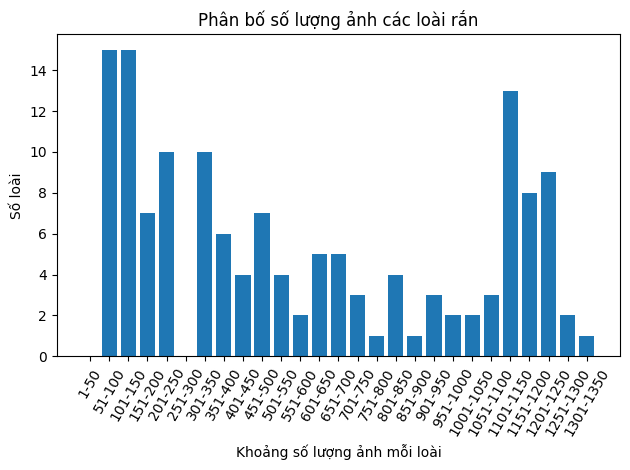

In [ ]:
# Tạo bins tự động với bước nhảy 50
max_count = 0
counts = []
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))
        if len(img_files) > max_count:
            max_count = len(img_files)

step = 50
bins = list(range(0, max_count + step, step))
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]

# Gom số loài vào từng khoảng
hist = [0] * (len(bins) - 1)
for c in counts:
    for i in range(len(bins) - 1):
        if bins[i] < c <= bins[i+1]:
            hist[i] += 1
            break

plt.bar(labels, hist)
plt.xlabel("Khoảng số lượng ảnh mỗi loài")
plt.ylabel("Số loài")
plt.title("Phân bố số lượng ảnh các loài rắn")
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

## Biểu đồ tròn cho số loài

Q1 (<= 189.0 ảnh), Q2 (<= 472.0 ảnh), Q3 (<= 1064.0 ảnh), Q4 (> 1064.0 ảnh)


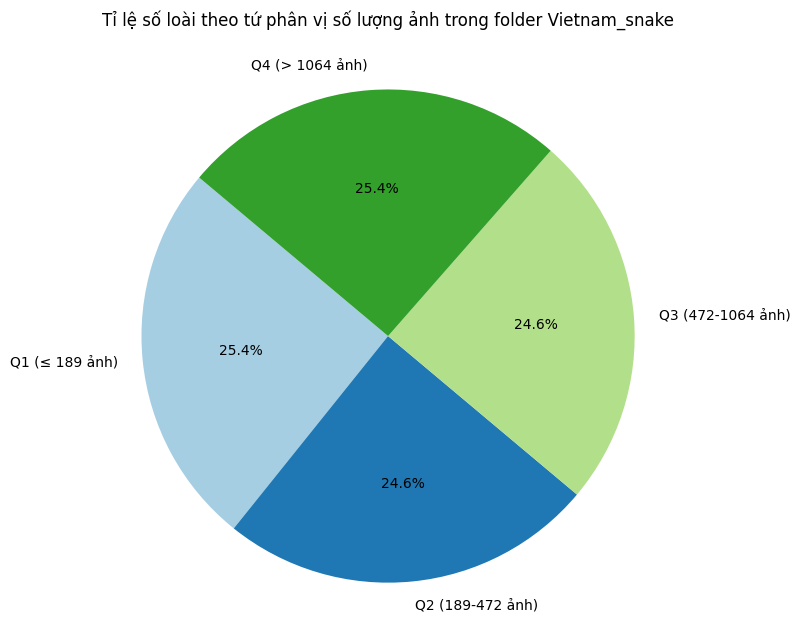

In [14]:
import os
import matplotlib.pyplot as plt
import numpy as np

folder = "Vietnam_snake_1024px_detect"
counts = []

# Đếm số ảnh của từng loài
for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))

counts = np.array(counts)

# Tính các tứ phân vị
q1 = np.percentile(counts, 25)
q2 = np.percentile(counts, 50)
q3 = np.percentile(counts, 75)

# In ra khoảng của từng tứ phân vị
print(f"Q1 (<= {q1:.1f} ảnh), Q2 (<= {q2:.1f} ảnh), Q3 (<= {q3:.1f} ảnh), Q4 (> {q3:.1f} ảnh)")

# Đếm số loài thuộc từng tứ phân vị
quartile_counts = [
    np.sum(counts <= q1),
    np.sum((counts > q1) & (counts <= q2)),
    np.sum((counts > q2) & (counts <= q3)),
    np.sum(counts > q3)
]
quartile_labels = [
    f'Q1 (≤ {q1:.0f} ảnh)',
    f'Q2 ({q1:.0f}-{q2:.0f} ảnh)',
    f'Q3 ({q2:.0f}-{q3:.0f} ảnh)',
    f'Q4 (> {q3:.0f} ảnh)'
]
colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c']

plt.figure(figsize=(7, 7))
plt.pie(quartile_counts, labels=quartile_labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Tỉ lệ số loài theo tứ phân vị số lượng ảnh trong folder Vietnam_snake",pad=30)
plt.axis('equal')
plt.show()

In [15]:
for label, count in zip(quartile_labels, quartile_counts):
    print(f"{label}: {count} loài")

Q1 (≤ 189 ảnh): 36 loài
Q2 (189-472 ảnh): 35 loài
Q3 (472-1064 ảnh): 35 loài
Q4 (> 1064 ảnh): 36 loài


# Kiểm tra kích thước ảnh sau khi crop

In [ ]:
image_paths = []

# Lấy tất cả đường dẫn ảnh từ các folder con
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'))]
        for f in img_files:
            image_paths.append(os.path.join(folder_path, f))

# Chọn 20 ảnh ngẫu nhiên
sample_images = random.sample(image_paths, min(20, len(image_paths)))

# In kích thước của 20 ảnh random
for img_path in sample_images:
    try:
        with Image.open(img_path) as img:
            print(f"{img_path}: {img.width}x{img.height}")
    except Exception as e:
        print(f"Lỗi mở {img_path}: {e}")

Vietnam_snake_1024px_detect/Gonyosoma_oxycephalum/266928838_02.jpg: 892x729
Vietnam_snake_1024px_detect/Pareas_carinatus/102537267_0.jpg: 642x620
Vietnam_snake_1024px_detect/Coelognathus_flavolineatus/72668618_12.jpg: 1024x130
Vietnam_snake_1024px_detect/Rhabdophis_tigrinus/248225513_62.jpg: 513x796
Vietnam_snake_1024px_detect/Oreocryptophis_porphyraceus/101379192_0.jpg: 747x340
Vietnam_snake_1024px_detect/Amphiesma_stolatum/243782667_5.jpg: 906x1016
Vietnam_snake_1024px_detect/Oreocryptophis_porphyraceus/277260131_9.jpg: 846x830
Vietnam_snake_1024px_detect/Lycodon_neomaculatus/294344142_0.jpg: 759x393
Vietnam_snake_1024px_detect/Pareas_carinatus/62131879_0.jpg: 321x292
Vietnam_snake_1024px_detect/Oligodon_fasciolatus/203762781_0.jpg: 905x802
Vietnam_snake_1024px_detect/Enhydris_enhydris/301244464_32.jpg: 894x427
Vietnam_snake_1024px_detect/Laticauda_colubrina/231866999_2.jpg: 455x640
Vietnam_snake_1024px_detect/Sibynophis_chinensis/4639353_3.jpg: 964x986
Vietnam_snake_1024px_detect/Na

# Bỏ những ảnh có chiều dài hoặc rộng dưới 200px

In [ ]:
import os
from PIL import Image
import shutil

root = "Vietnam_snake_1024px_detect"
dst_root = "Vietnam_snake_resize"
os.makedirs(dst_root, exist_ok=True)

for species_folder in os.listdir(root):
    folder_path = os.path.join(root, species_folder)
    if os.path.isdir(folder_path):
        dst_species_folder = os.path.join(dst_root, species_folder)
        os.makedirs(dst_species_folder, exist_ok=True)
        count = 0
        for file in os.listdir(folder_path):
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                img_path = os.path.join(folder_path, file)
                try:
                    with Image.open(img_path) as img:
                        if img.width >= 200 and img.height >= 200:
                            shutil.copy2(img_path, os.path.join(dst_species_folder, file))
                            count += 1
                except Exception as e:
                    print(f"Lỗi mở {img_path}: {e}")
        if count > 0:
            print(f"{species_folder}: {count} ảnh đã copy sang {dst_species_folder}")

print("✅ Đã copy xong tất cả ảnh >= 200x200px sang folder mới.")

Hebius_sauteri: 424 ảnh đã copy sang Vietnam_snake_resize/Hebius_sauteri
Rhabdophis_nigrocinctus: 192 ảnh đã copy sang Vietnam_snake_resize/Rhabdophis_nigrocinctus
Lycodon_ruhstrati: 1063 ảnh đã copy sang Vietnam_snake_resize/Lycodon_ruhstrati
Trimeresurus_albolabris: 662 ảnh đã copy sang Vietnam_snake_resize/Trimeresurus_albolabris
Rhabdophis_subminiatus: 710 ảnh đã copy sang Vietnam_snake_resize/Rhabdophis_subminiatus
Ptyas_major: 935 ảnh đã copy sang Vietnam_snake_resize/Ptyas_major
Rhabdophis_helleri: 828 ảnh đã copy sang Vietnam_snake_resize/Rhabdophis_helleri
Pareas_hamptoni: 107 ảnh đã copy sang Vietnam_snake_resize/Pareas_hamptoni
Trimeresurus_vogeli: 486 ảnh đã copy sang Vietnam_snake_resize/Trimeresurus_vogeli
Boiga_cyanea: 727 ảnh đã copy sang Vietnam_snake_resize/Boiga_cyanea
Enhydris_subtaeniata: 109 ảnh đã copy sang Vietnam_snake_resize/Enhydris_subtaeniata
Lycodon_futsingensis: 623 ảnh đã copy sang Vietnam_snake_resize/Lycodon_futsingensis
Lycodon_laoensis: 509 ảnh đã co

# Resize 224px

In [ ]:
from PIL import Image
import os
from concurrent.futures import ThreadPoolExecutor

src_root = "Vietnam_snake_resize"
dst_root = "Vietnam_snake_224px"
os.makedirs(dst_root, exist_ok=True)

def resize_image(src_img_path, dst_img_path):
    try:
        img = Image.open(src_img_path)
        img = img.resize((224, 224), Image.LANCZOS)
        img.save(dst_img_path)
    except Exception as e:
        print(f"Lỗi resize {src_img_path}: {e}")

for species_folder in os.listdir(src_root):
    src_folder_path = os.path.join(src_root, species_folder)
    dst_folder_path = os.path.join(dst_root, species_folder)
    if os.path.isdir(src_folder_path):
        os.makedirs(dst_folder_path, exist_ok=True)
        jobs = []
        with ThreadPoolExecutor(max_workers=16) as executor:  # Tăng số luồng nếu máy mạnh
            for file in os.listdir(src_folder_path):
                if file.lower().endswith(".jpg"):
                    src_img_path = os.path.join(src_folder_path, file)
                    dst_img_path = os.path.join(dst_folder_path, file)
                    jobs.append(executor.submit(resize_image, src_img_path, dst_img_path))
            for job in jobs:
                job.result()

# Kiểm tra kích thước ảnh

In [ ]:
image_paths = []

# Lấy tất cả đường dẫn ảnh từ các folder con
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'))]
        for f in img_files:
            image_paths.append(os.path.join(folder_path, f))

# Chọn 20 ảnh ngẫu nhiên
sample_images = random.sample(image_paths, min(20, len(image_paths)))

# In kích thước của 20 ảnh random
for img_path in sample_images:
    try:
        with Image.open(img_path) as img:
            print(f"{img_path}: {img.width}x{img.height}")
    except Exception as e:
        print(f"Lỗi mở {img_path}: {e}")

Vietnam_snake_224px/Sibynophis_collaris/4639353_18.jpg: 224x224
Vietnam_snake_224px/Acrochordus_granulatus/71574003_36.jpg: 224x224
Vietnam_snake_224px/Oligodon_cyclurus/249132974_0.jpg: 224x224
Vietnam_snake_224px/Elaphe_taeniura/282831892_0.jpg: 224x224
Vietnam_snake_224px/Rhabdophis_chrysargos/247078945_0.jpg: 224x224
Vietnam_snake_224px/Coelognathus_radiatus/146442719_12.jpg: 224x224
Vietnam_snake_224px/Lycodon_davisonii/13579559_0.jpg: 224x224
Vietnam_snake_224px/Fowlea_flavipunctata/240329806_22.jpg: 224x224
Vietnam_snake_224px/Boiga_kraepelini/308616956_02.jpg: 224x224
Vietnam_snake_224px/Pareas_margaritophorus/128384805_1.jpg: 224x224
Vietnam_snake_224px/Oreocryptophis_porphyraceus/228144448_92.jpg: 224x224
Vietnam_snake_224px/Bungarus_candidus/306443816_0.jpg: 224x224
Vietnam_snake_224px/Bungarus_fasciatus/248200588_42.jpg: 224x224
Vietnam_snake_224px/Rhabdophis_subminiatus/195877702_12.jpg: 224x224
Vietnam_snake_224px/Dendrelaphis_ngansonensis/63555675_0.jpg: 224x224
Vietnam_

# Số lượng các loài và số ảnh của mỗi loài sau khi resize về 224px

## Số lượng ảnh 

In [5]:
import os

folder = "Vietnam_snake_224px"
count = 0

for species_folder in os.listdir(folder):
    species_path = os.path.join(folder, species_folder)
    if os.path.isdir(species_path):
        for file in os.listdir(species_path):
            file_path = os.path.join(species_path, file)
            # Đếm tất cả file, hoặc chỉ đếm file ảnh nếu muốn:
            if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                count += 1

print(f"Tổng số ảnh trong {folder}: {count}")

Tổng số ảnh trong Vietnam_snake_224px: 71280


## Số lượng các loài

In [ ]:
folder = "Vietnam_snake_224px"
species_list = []

for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        species_name = species_folder.replace("_", " ")
        print(f"{species_name}: {len(img_files)} ảnh")
        species_list.append(species_name)

print(f"\nTổng số loài: {len(species_list)}")

Achalinus rufescens: 367 ảnh
Achalinus spinalis: 190 ảnh
Acrochordus granulatus: 397 ảnh
Acrochordus javanicus: 56 ảnh
Ahaetulla fusca: 484 ảnh
Ahaetulla prasina: 694 ảnh
Ahaetulla rufusoculara: 71 ảnh
Amphiesma stolatum: 980 ảnh
Argyrophis diardii: 90 ảnh
Blue-lipped sea krait: 830 ảnh
Boiga cyanea: 727 ảnh
Boiga guangxiensis: 152 ảnh
Boiga jaspidea: 367 ảnh
Boiga kraepelini: 1001 ảnh
Boiga multomaculata: 1132 ảnh
Boiga siamensis: 314 ảnh
Bungarus candidus: 932 ảnh
Bungarus fasciatus: 1021 ảnh
Bungarus wanghaotingi: 134 ảnh
Calamaria septentrionalis: 283 ảnh
Calliophis maculiceps: 294 ảnh
Calloselasma rhodostoma: 1012 ảnh
Cerberus schneiderii: 964 ảnh
Checkered keelback: 904 ảnh
Chrysopelea ornata: 983 ảnh
Coelognathus flavolineatus: 965 ảnh
Coelognathus radiatus: 1032 ảnh
Cylindrophis jodiae: 580 ảnh
Cylindrophis ruffus: 394 ảnh
Deinagkistrodon acutus: 991 ảnh
Dendrelaphis ngansonensis: 403 ảnh
Dendrelaphis proarchos: 174 ảnh
Dendrelaphis subocularis: 274 ảnh
Dryophiops rubescens: 41

## Số ảnh của mỗi loài

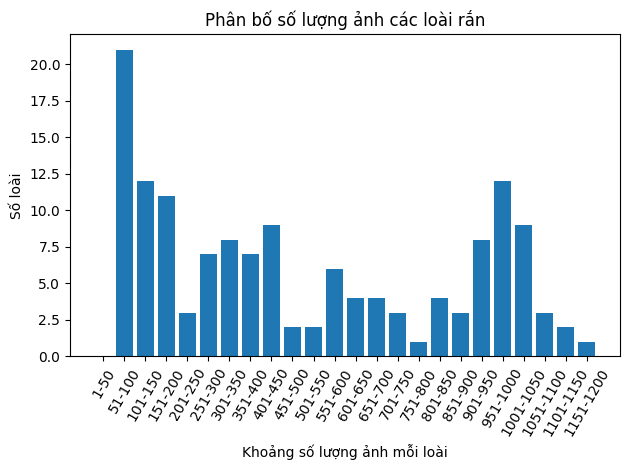

In [ ]:
# Tạo bins tự động với bước nhảy 50
max_count = 0
counts = []
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))
        if len(img_files) > max_count:
            max_count = len(img_files)

step = 50
bins = list(range(0, max_count + step, step))
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]

# Gom số loài vào từng khoảng
hist = [0] * (len(bins) - 1)
for c in counts:
    for i in range(len(bins) - 1):
        if bins[i] < c <= bins[i+1]:
            hist[i] += 1
            break

plt.bar(labels, hist)
plt.xlabel("Khoảng số lượng ảnh mỗi loài")
plt.ylabel("Số loài")
plt.title("Phân bố số lượng ảnh các loài rắn")
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

##

## Biểu đồ tròn cho số loài

Q1 (<= 166.5 ảnh), Q2 (<= 421.5 ảnh), Q3 (<= 885.8 ảnh), Q4 (> 885.8 ảnh)


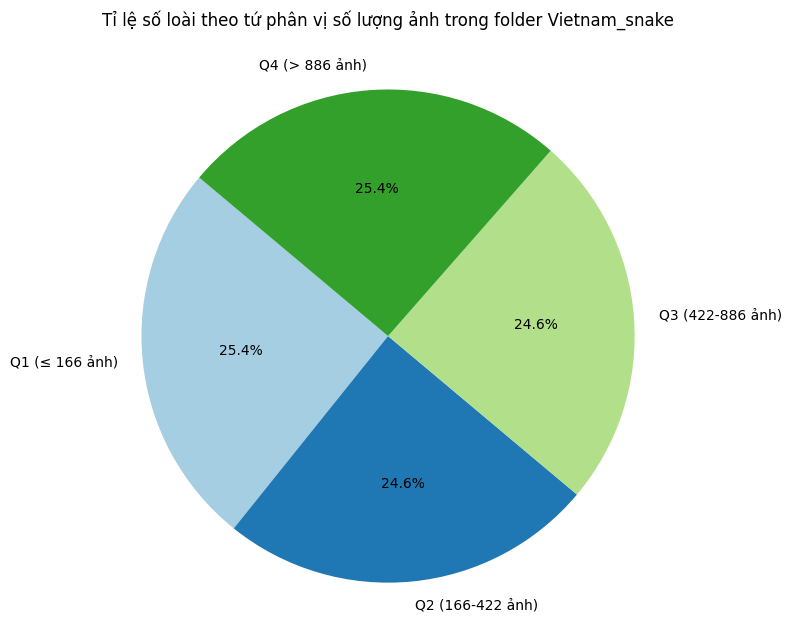

In [17]:
import os
import matplotlib.pyplot as plt
import numpy as np

folder = "Vietnam_snake_224px"
counts = []

# Đếm số ảnh của từng loài
for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))

counts = np.array(counts)

# Tính các tứ phân vị
q1 = np.percentile(counts, 25)
q2 = np.percentile(counts, 50)
q3 = np.percentile(counts, 75)

# In ra khoảng của từng tứ phân vị
print(f"Q1 (<= {q1:.1f} ảnh), Q2 (<= {q2:.1f} ảnh), Q3 (<= {q3:.1f} ảnh), Q4 (> {q3:.1f} ảnh)")

# Đếm số loài thuộc từng tứ phân vị
quartile_counts = [
    np.sum(counts <= q1),
    np.sum((counts > q1) & (counts <= q2)),
    np.sum((counts > q2) & (counts <= q3)),
    np.sum(counts > q3)
]
quartile_labels = [
    f'Q1 (≤ {q1:.0f} ảnh)',
    f'Q2 ({q1:.0f}-{q2:.0f} ảnh)',
    f'Q3 ({q2:.0f}-{q3:.0f} ảnh)',
    f'Q4 (> {q3:.0f} ảnh)'
]
colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c']

plt.figure(figsize=(7, 7))
plt.pie(quartile_counts, labels=quartile_labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Tỉ lệ số loài theo tứ phân vị số lượng ảnh trong folder Vietnam_snake",pad=30)
plt.axis('equal')
plt.show()

In [18]:
for label, count in zip(quartile_labels, quartile_counts):
    print(f"{label}: {count} loài")

Q1 (≤ 166 ảnh): 36 loài
Q2 (166-422 ảnh): 35 loài
Q3 (422-886 ảnh): 35 loài
Q4 (> 886 ảnh): 36 loài


# Folder sau khi lọc thủ công loại bỏ ảnh nhiễu

## Số lượng ảnh

In [21]:
import os

folder = "VietNam_Snake_DataLast"
count = 0

for species_folder in os.listdir(folder):
    species_path = os.path.join(folder, species_folder)
    if os.path.isdir(species_path):
        for file in os.listdir(species_path):
            file_path = os.path.join(species_path, file)
            # Đếm tất cả file, hoặc chỉ đếm file ảnh nếu muốn:
            if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                count += 1

print(f"Tổng số ảnh trong {folder}: {count}")

Tổng số ảnh trong VietNam_Snake_DataLast: 32511


## Số lượng các loài

In [19]:
folder = "VietNam_Snake_DataLast"
species_list = []

for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        species_name = species_folder.replace("_", " ")
        print(f"{species_name}: {len(img_files)} ảnh")
        species_list.append(species_name)

print(f"\nTổng số loài: {len(species_list)}")

Achalinus rufescens: 78 ảnh
Achalinus spinalis: 84 ảnh
Acrochordus granulatus: 289 ảnh
Acrochordus javanicus: 48 ảnh
Ahaetulla fusca: 174 ảnh
Ahaetulla prasina: 128 ảnh
Ahaetulla rufusoculara: 53 ảnh
Amphiesma stolatum: 501 ảnh
Argyrophis diardii: 48 ảnh
Blue-lipped sea krait: 538 ảnh
Boiga cyanea: 528 ảnh
Boiga guangxiensis: 46 ảnh
Boiga jaspidea: 265 ảnh
Boiga kraepelini: 441 ảnh
Boiga multomaculata: 658 ảnh
Boiga siamensis: 197 ảnh
Bungarus candidus: 467 ảnh
Bungarus fasciatus: 573 ảnh
Calamaria septentrionalis: 165 ảnh
Calliophis maculiceps: 114 ảnh
Calloselasma rhodostoma: 675 ảnh
Cerberus schneiderii: 276 ảnh
Checkered keelback: 470 ảnh
Chrysopelea ornata: 449 ảnh
Coelognathus flavolineatus: 195 ảnh
Coelognathus radiatus: 573 ảnh
Cylindrophis jodiae: 309 ảnh
Cylindrophis ruffus: 320 ảnh
Deinagkistrodon acutus: 679 ảnh
Dendrelaphis ngansonensis: 167 ảnh
Dendrelaphis proarchos: 70 ảnh
Dendrelaphis subocularis: 125 ảnh
Dryophiops rubescens: 273 ảnh
Elaphe carinata: 494 ảnh
Elaphe mo

## Số ảnh mỗi loài

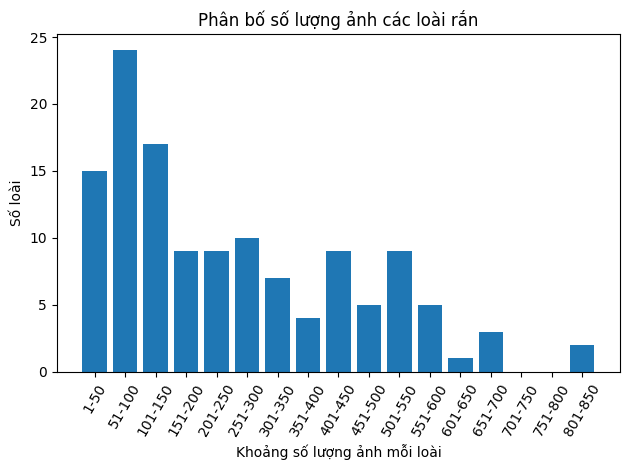

In [20]:
# Tạo bins tự động với bước nhảy 50
max_count = 0
counts = []
for species_folder in os.listdir(folder):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))
        if len(img_files) > max_count:
            max_count = len(img_files)

step = 50
bins = list(range(0, max_count + step, step))
labels = [f"{bins[i]+1}-{bins[i+1]}" for i in range(len(bins)-1)]

# Gom số loài vào từng khoảng
hist = [0] * (len(bins) - 1)
for c in counts:
    for i in range(len(bins) - 1):
        if bins[i] < c <= bins[i+1]:
            hist[i] += 1
            break

plt.bar(labels, hist)
plt.xlabel("Khoảng số lượng ảnh mỗi loài")
plt.ylabel("Số loài")
plt.title("Phân bố số lượng ảnh các loài rắn")
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

## Biểu đồ tròn cho số loài

Q1 (<= 78.0 ảnh), Q2 (<= 197.0 ảnh), Q3 (<= 413.0 ảnh), Q4 (> 413.0 ảnh)


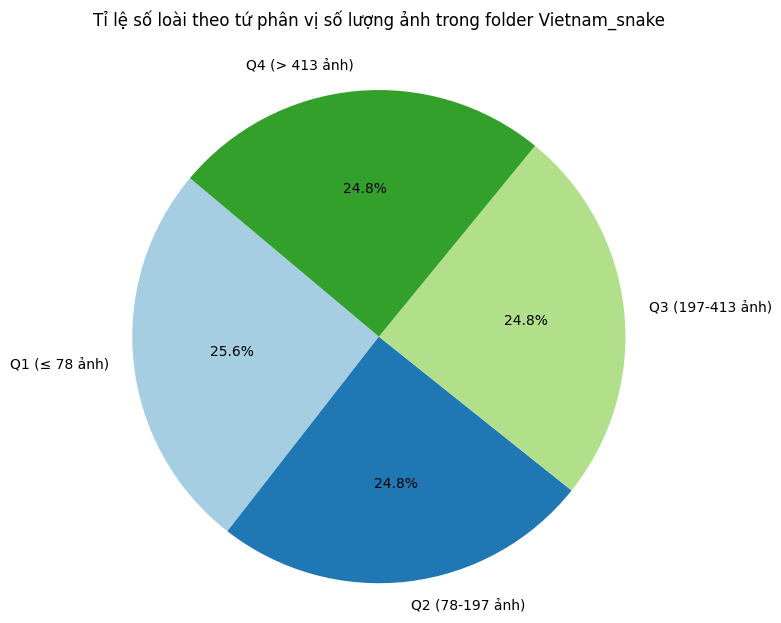

In [22]:
import os
import matplotlib.pyplot as plt
import numpy as np

folder = "VietNam_Snake_DataLast"
counts = []

# Đếm số ảnh của từng loài
for species_folder in sorted(os.listdir(folder)):
    folder_path = os.path.join(folder, species_folder)
    if os.path.isdir(folder_path):
        img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]
        counts.append(len(img_files))

counts = np.array(counts)

# Tính các tứ phân vị
q1 = np.percentile(counts, 25)
q2 = np.percentile(counts, 50)
q3 = np.percentile(counts, 75)

# In ra khoảng của từng tứ phân vị
print(f"Q1 (<= {q1:.1f} ảnh), Q2 (<= {q2:.1f} ảnh), Q3 (<= {q3:.1f} ảnh), Q4 (> {q3:.1f} ảnh)")

# Đếm số loài thuộc từng tứ phân vị
quartile_counts = [
    np.sum(counts <= q1),
    np.sum((counts > q1) & (counts <= q2)),
    np.sum((counts > q2) & (counts <= q3)),
    np.sum(counts > q3)
]
quartile_labels = [
    f'Q1 (≤ {q1:.0f} ảnh)',
    f'Q2 ({q1:.0f}-{q2:.0f} ảnh)',
    f'Q3 ({q2:.0f}-{q3:.0f} ảnh)',
    f'Q4 (> {q3:.0f} ảnh)'
]
colors = ['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c']

plt.figure(figsize=(7, 7))
plt.pie(quartile_counts, labels=quartile_labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Tỉ lệ số loài theo tứ phân vị số lượng ảnh trong folder Vietnam_snake",pad=30)
plt.axis('equal')
plt.show()

In [23]:
for label, count in zip(quartile_labels, quartile_counts):
    print(f"{label}: {count} loài")

Q1 (≤ 78 ảnh): 33 loài
Q2 (78-197 ảnh): 32 loài
Q3 (197-413 ảnh): 32 loài
Q4 (> 413 ảnh): 32 loài


# Biểu đồ số lượng ảnh của các folder 

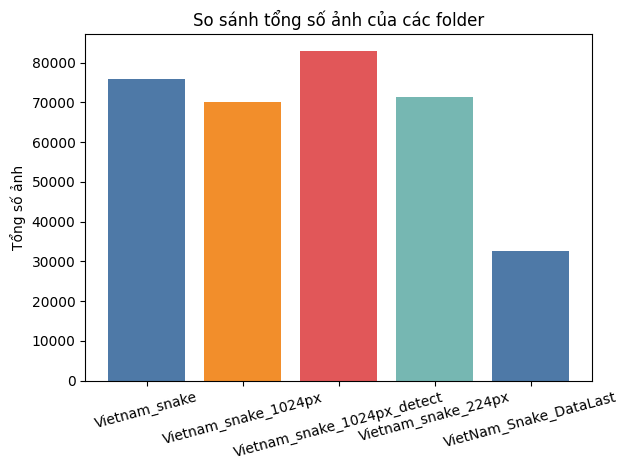

In [24]:
import os
import matplotlib.pyplot as plt

folders = [
    "Vietnam_snake",
    "Vietnam_snake_1024px",
    "Vietnam_snake_1024px_detect",
    "Vietnam_snake_224px",
    "VietNam_Snake_DataLast"
]

counts = []
for folder in folders:
    count = 0
    for species_folder in os.listdir(folder):
        species_path = os.path.join(folder, species_folder)
        if os.path.isdir(species_path):
            for file in os.listdir(species_path):
                file_path = os.path.join(species_path, file)
                if os.path.isfile(file_path) and file.lower().endswith(('.jpg', '.jpeg', '.png', '.webp')):
                    count += 1
    counts.append(count)

plt.bar(folders, counts, color=['#4e79a7', '#f28e2b', '#e15759', '#76b7b2'])
plt.ylabel("Tổng số ảnh")
plt.title("So sánh tổng số ảnh của các folder")
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()